# Lab 5 - Neural Networks

## Author: Thomas Selin

In this lab I used a pre-trained neural network that is designed for image classification. I used a number of different visualization options. I explored how LIME can be used for images.

I then used the techniques on another model to try and explain how it is working, and to investigate if there is anything wrong with its predictions.

## Setup

### Package Installation

**Remember to restart the session if using Google Colab. Otherwise you will end up with erroneous imports later on.**

In [40]:
%%capture
%pip install -U tensorflow==2.15.1 lime==0.2.0.1 tf-keras-vis==0.8.6 numpy==1.26.4 pandas==2.0.3

### Package import

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import warnings
import absl.logging

from tensorflow.keras.applications.vgg16 import VGG16 as Model
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.vgg16 import preprocess_input

### Intializations and loading data

The easiest approach to using the data for the lab, is to download the data folder (lab5_data) from the lab assignment page on blackboard. Reupload them to your root folder on your google drive. The cell below mounts your google drive to reach those uploaded files later. If you choose to do something else, you are free to do so but remember to update the file paths.

In [ ]:
import os

absl.logging.set_verbosity(absl.logging.ERROR)
warnings.filterwarnings('ignore')

if 'google.colab' in str(get_ipython()):
     from google.colab import drive
     drive.mount('/content/drive')
     GDRIVE = 'drive/MyDrive/ExplainableAIHH/Lab5'
else:
     GDRIVE = '.'

FOLDER = 'lab5_data'
basepath = os.path.join(GDRIVE, FOLDER)
!ls $basepath

bear.jpg        goldfish.jpg    husky_wolves    triceratops.jpg


## Neural Network Image Activation visualizations

You will use the VGG16 model. If you are not familiar with the model, you can read more about it - [here](https://keras.io/api/applications/vgg/) and [here](https://arxiv.org/pdf/1409.1556). The framework that was used was [Keras](https://keras.io/getting_started/).

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

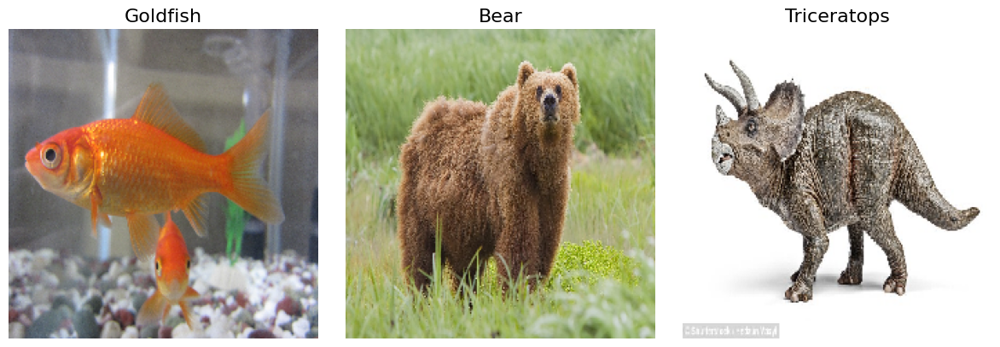

In [49]:
model = Model(weights='imagenet', include_top=True)
model.summary()

# Image titles
image_titles = ['Goldfish', 'Bear', 'Triceratops']
# Load images and Convert them to a Numpy array
img1 = load_img(os.path.join(basepath, 'goldfish.jpg'), target_size=(224, 224))
img2 = load_img(os.path.join(basepath, 'bear.jpg'), target_size=(224, 224))
img3 = load_img(os.path.join(basepath, 'triceratops.jpg'), target_size=(224, 224))
images = np.asarray([np.array(img1), np.array(img2), np.array(img3)])

# Preparing input data for VGG16
X = preprocess_input(images)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

Boilerplate code for the tf-Keras-vis package.

In [50]:
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

def score_function(output):
    # This version returns the result for the corresponding class from the
    # prediction of each image we are to show.
    # output[x][y] -> x = which image, y = which class in the imagenet labels
    return (output[0][1], output[1][294], output[2][51])

# Alters the softmax output to a linear output
replace2linear = ReplaceToLinear()

# The actual labels to each category that we investigate, i.e. the goldfish,
# bear, and triceratops label indices.
score = CategoricalScore([1, 294, 51])

Saliency map

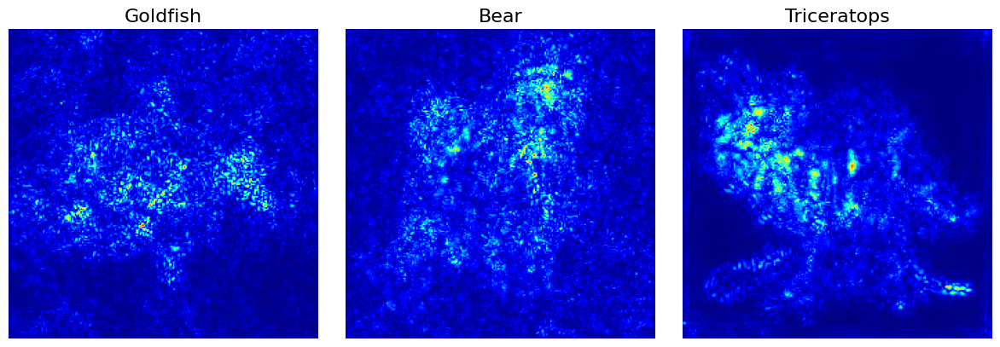

In [51]:
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency

# Create Saliency object.
saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

# Generate saliency map
saliency_map = saliency(score, X)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(saliency_map[i], cmap='jet')
    ax[i].axis('off')
plt.tight_layout()
plt.show()

Smooth Saliency map.

In [ ]:
# Generate saliency map with smoothing that reduce noise by adding noise
saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

saliency_map = saliency(score,
                        X,
                        smooth_samples=20, # The number of calculating gradients iterations.
                        smooth_noise=0.20) # noise spread level.

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=14)
    ax[i].imshow(saliency_map[i], cmap='jet')
    ax[i].axis('off')
plt.tight_layout()
plt.show()

ValueError: Input 0 of layer "model_18" is incompatible with the layer: expected shape=(None, 256, 256, 3), found shape=(3, 224, 224, 3)

GRAD-Cam

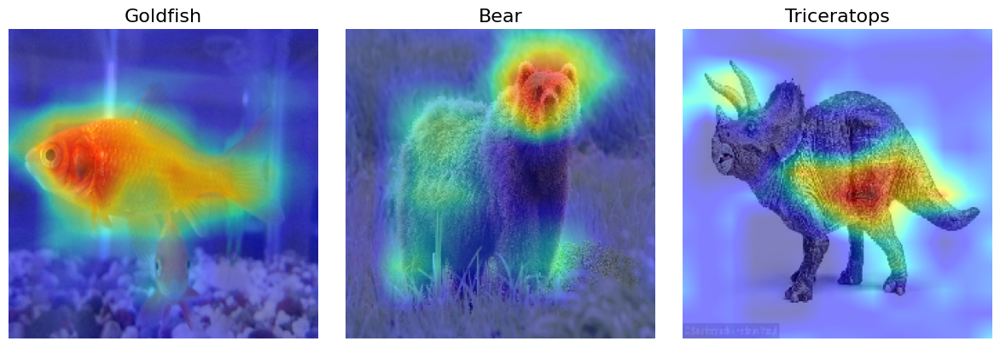

In [53]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

# Create Gradcam object
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
cam = gradcam(score,
              X,
              penultimate_layer=-1)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax[i].axis('off')
plt.tight_layout()
plt.show()

GRAD-CAM++

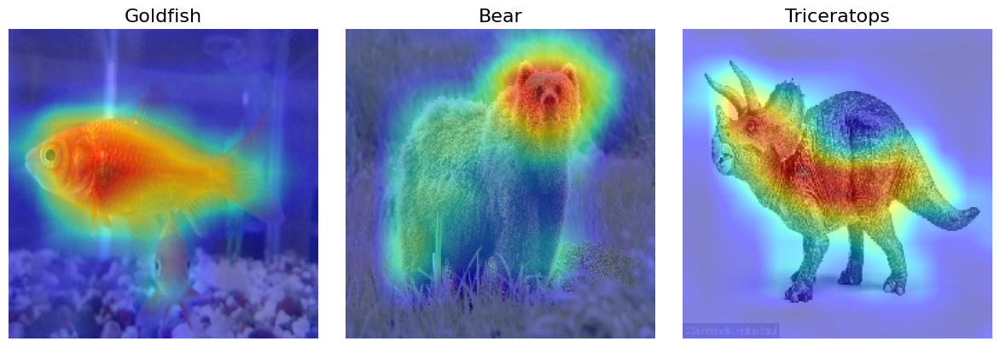

In [54]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)

# Generate heatmap with GradCAM++
cam = gradcam(score,
              X,
              penultimate_layer=-1)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
    ax[i].axis('off')
plt.tight_layout()
plt.show()

(Faster) ScoreCAM

3/3 [==============================] - 4s 1s/step


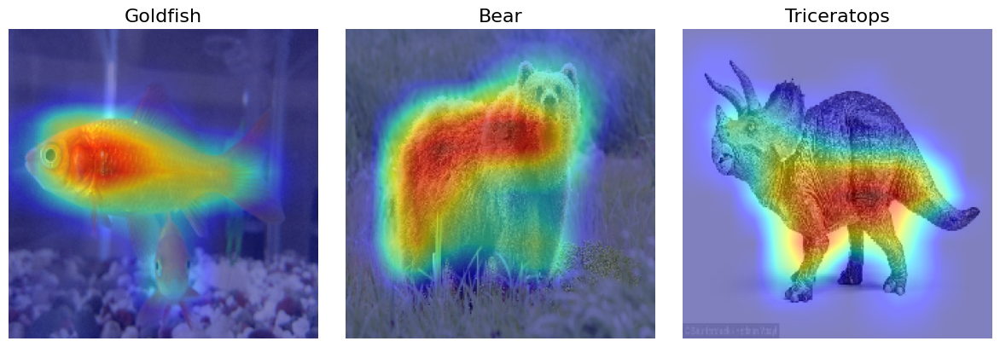

In [55]:
# Fast ScoreCAM
from tf_keras_vis.scorecam import Scorecam

# Create ScoreCAM object
scorecam = Scorecam(model, model_modifier=replace2linear)

# Generate heatmap with Faster-ScoreCAM
cam = scorecam(score,
               X,
               penultimate_layer=-1,
               max_N=10)

# Render
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    heatmap = np.uint8(cm.jet(cam[i])[..., :3] * 255)
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i])
    ax[i].imshow(heatmap, cmap='jet', alpha=0.5)
    ax[i].axis('off')
plt.tight_layout()
plt.show()

These visualization techniques try to highlight which pixels provide the most importance to the prediction of the image.

#### **Lab question:** What's you view of the techniques? Are they useful?

I think they are useful, especially it can help identify if the model is focusing on something that we dont want it to focus on (e.g. the model bases it's prediction on features that shouldn't be relevant).

## Neural Network Layer Dissections/visualizations
The scoring from before was changed to work in this context. The following score, when used, returns the value from the 3rd filter in the **block5_conv3** layer.

In [ ]:
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer, ReplaceToLinear

layer_name = 'block5_conv3' # The target layer that is the last layer of the pretrained VGG16 model.

# This instance constructs new model whose output is replaced to `block5_conv3` layer's output.
extract_intermediate_layer = ExtractIntermediateLayer(index_or_name=layer_name)
# This instance modify the model's last activation function to linear one.
replace2linear = ReplaceToLinear()

filter_number = 3
score = CategoricalScore(filter_number)

Create an activation maximum instance

In [60]:
from tf_keras_vis.activation_maximization import ActivationMaximization

activation_maximization = ActivationMaximization(model,
                                                 # Please note that `extract_intermediate_layer` has to come before `replace2linear`.
                                                 model_modifier=[extract_intermediate_layer, replace2linear],
                                                 clone=False)

Visualizes the convolutional layer.

In [61]:
from tf_keras_vis.activation_maximization.callbacks import Progress

# Generate maximized activation
activations = activation_maximization(score,
                                      callbacks=[Progress()])

200/200 [==============================] - 55s 274ms/step - Score: 379.5276 - TotalVariation2D: 10.2250 - Norm: 38.3413


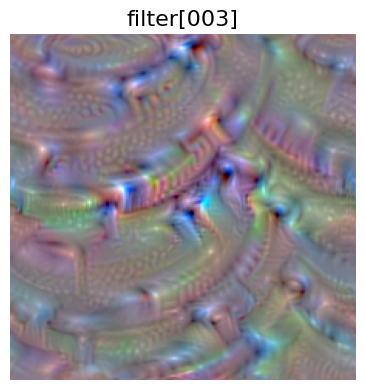

In [62]:
# Render the filter from above
f, ax = plt.subplots(figsize=(4, 4))
ax.imshow(tf.cast(activations[0], np.uint8))
ax.set_title('filter[{:03d}]'.format(filter_number), fontsize=16)
ax.axis('off')
plt.tight_layout()
plt.show()

These techniques instead tries to visualize the features each layer is seeing from an image. 

#### **Lab question:** How would you describe the above? Is it useful for you to understand this filter? Can you understand it?

It is somewhat useful, but still unclear what it is. Looks like this filter is likely to be be highly activated for images of snakes. The pattern on the "coils" looks like snake skin and in the middle it looks like eyes. Snakes often have in this kind of "coiled" body position. As this is a filter from the pretraioned VGG16 model it is likely that this filter has learned to identify snakes.

## LIME
The LIME library also works well on images, to see where the model puts its interest in the images it predicts upon.


In [63]:
%%capture
from lime import lime_image

# creating the explainer object
explainer = lime_image.LimeImageExplainer()

# You can view each individual image we have looked at before by
# changing the index in the images[] variable below.
explanation = explainer.explain_instance(images[2], model.predict
                                         , top_labels=5,
                                         hide_color=0, num_samples=5000)



It is important that you run a large amount of samples, otherwise you could get misleading results. Try and lower the num_samples substantially above and see what happens.

You can visualize with both the image as the background

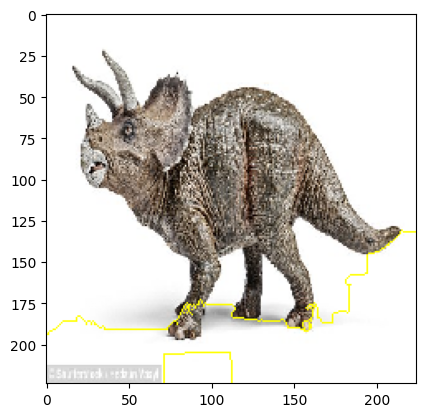

In [64]:
from skimage.segmentation import mark_boundaries
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp, mask))

Or just the mask itself.

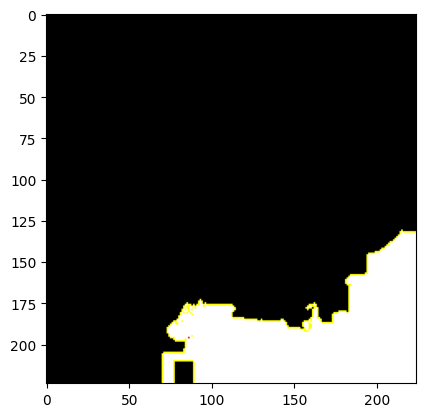

In [38]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp, mask))

# Part 2 of assignment - Investigate a blackbox model
I trained a purposely not very accurate blackbox model on a very small dataset and explored if I could identify what the model has actually learned. The dataset is based on the Dogs and Wolves dataset from [Kaggle](https://www.kaggle.com/datasets/harishvutukuri/dogs-vs-wolves?resource=download). It has been significantly reduced and images has been picked out to only contain huskies and wolves. Some additional images have been added manually.

The model was investigated using **some** of the techniques shown from **tf-keras-vis** and using the **LIME** library to explain what the model have actually learned. See [tf-keras-vis](https://keisen.github.io/tf-keras-vis-docs/index.html) for more information about the library.

I looked at which images were correctly classified in the validation set and which weren't. I visualized which parts of the images that were of importance for the model.

## Black box training
Training the model to be analyzed.

In [65]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPool2D, Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import matplotlib.pyplot as plt
import numpy as np

training_path = os.path.join(basepath, 'husky_wolves/training/')
validation_path = os.path.join(basepath, 'husky_wolves/validation/')

image_gen = ImageDataGenerator(rescale=1./255)

# Training generator
train_generator = image_gen.flow_from_directory(
    directory=training_path,
    target_size=(256,256),
    batch_size=20,
    shuffle=True,
    seed=101
)

# Validation generator
val_generator = image_gen.flow_from_directory(
    directory=validation_path,
    target_size=(256,256),
    batch_size=20,
    shuffle=False,  # Don't shuffle validation
    seed=101
)

print(f"Training samples: {train_generator.samples}")
print(f"Validation samples: {val_generator.samples}")

Found 76 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Training samples: 76
Validation samples: 16


In [ ]:
def get_model(input_shape):
    """
    This function builds and compiles a CNN model using the functional API. It returns the model.
    """
    input_layer = Input(input_shape)
    h = Conv2D(name="CONV_LAYER_1", filters=8, kernel_size=(8,8), padding='SAME', activation='relu')(input_layer)
    h = MaxPool2D((2,2))(h)
    h = Conv2D(4, (4,4), name="CONV_LAYER_2", padding='SAME', activation='relu')(h)
    h = MaxPool2D((2,2))(h)
    Flatten_layer = Flatten()(h)
    h = Dense(16, activation='relu')(Flatten_layer)
    output_layer = Dense(2, activation='softmax')(h)
    model = Model(inputs= input_layer, outputs = output_layer)
    opt = tf.keras.optimizers.Adam(learning_rate=0.0005)
    model.compile(optimizer=opt, loss = 'categorical_crossentropy', metrics = [tf.keras.metrics.CategoricalAccuracy(name='accuracy')])
    return model

model = get_model((256, 256, 3))
model.summary()

Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 CONV_LAYER_1 (Conv2D)       (None, 256, 256, 8)       1544      
                                                                 
 max_pooling2d_18 (MaxPooli  (None, 128, 128, 8)       0         
 ng2D)                                                           
                                                                 
 CONV_LAYER_2 (Conv2D)       (None, 128, 128, 4)       516       
                                                                 
 max_pooling2d_19 (MaxPooli  (None, 64, 64, 4)         0         
 ng2D)                                                           
                                                                 
 flatten_9 (Flatten)         (None, 16384)             0  

Epoch 1/35
4/4 [==============================] - 2s 406ms/step - loss: 0.1597 - accuracy: 0.9605 - val_loss: 0.9375 - val_accuracy: 0.6250
Epoch 2/35
4/4 [==============================] - 2s 393ms/step - loss: 0.1766 - accuracy: 0.9342 - val_loss: 0.6408 - val_accuracy: 0.6250
Epoch 3/35
4/4 [==============================] - 2s 402ms/step - loss: 0.1185 - accuracy: 0.9737 - val_loss: 0.8601 - val_accuracy: 0.6250
Epoch 4/35
4/4 [==============================] - 2s 400ms/step - loss: 0.1506 - accuracy: 0.9605 - val_loss: 0.6452 - val_accuracy: 0.6250
Epoch 5/35
4/4 [==============================] - 2s 394ms/step - loss: 0.1020 - accuracy: 1.0000 - val_loss: 0.9731 - val_accuracy: 0.6250
Epoch 6/35
4/4 [==============================] - 2s 419ms/step - loss: 0.0869 - accuracy: 1.0000 - val_loss: 0.6638 - val_accuracy: 0.6250
Epoch 7/35
4/4 [==============================] - 2s 396ms/step - loss: 0.0837 - accuracy: 0.9868 - val_loss: 0.9017 - val_accuracy: 0.6250
Epoch 8/35
4/4 [====

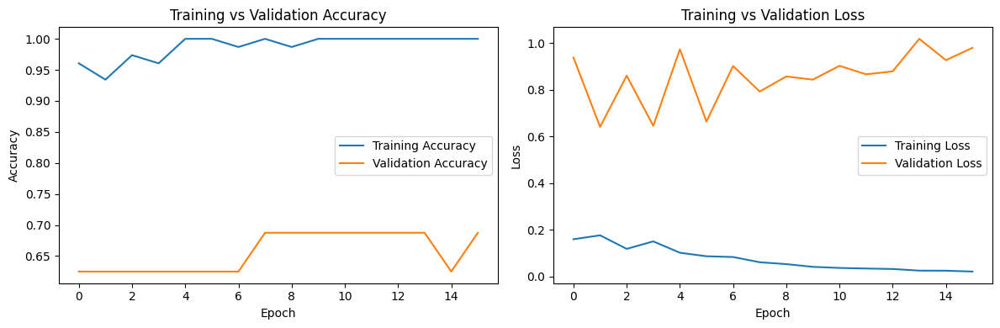

Best weights restored from epoch: 8


In [80]:
from tensorflow.keras.callbacks import EarlyStopping

# Monitor VALIDATION accuracy, not training accuracy
early_stopping = EarlyStopping(
    monitor='val_accuracy',  # Changed from 'accuracy'
    patience=8,
    restore_best_weights=True
)

# Fit with validation data
history = model.fit(
    train_generator,
    validation_data=val_generator,  # Added validation data
    epochs=35,
    callbacks=[early_stopping]
)

# Plot training history to see overfitting
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training vs Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training vs Validation Loss')
plt.tight_layout()
plt.show()

print(f"Best weights restored from epoch: {early_stopping.best_epoch + 1}")

## Loading validation data.

In [81]:
images = np.asarray([load_img(os.path.join(validation_path, 'husky', 'husky_validation_{0}.jpg'.format(x)), target_size=(256,256)) for x in range(1,9)] + [load_img(os.path.join(validation_path, 'wolf', 'wolf_validation_{0}.jpg'.format(x)), target_size=(256,256)) for x in range(1,9)])
labels = np.array([0 for x in range(8)] + [1 for x in range(8)])
class_names = ['husky', 'wolf']
images = images/255


In [82]:
count = 0
i = 0
predictions = model.predict(images)
for i in range(len(labels)):
  if np.argmax(predictions[i]) == labels[i]:
    count += 1
print('validation accuracy %.3f'%(count/len(labels)))

1/1 [==============================] - 0s 53ms/step
validation accuracy 0.688


## Visualizing validation data

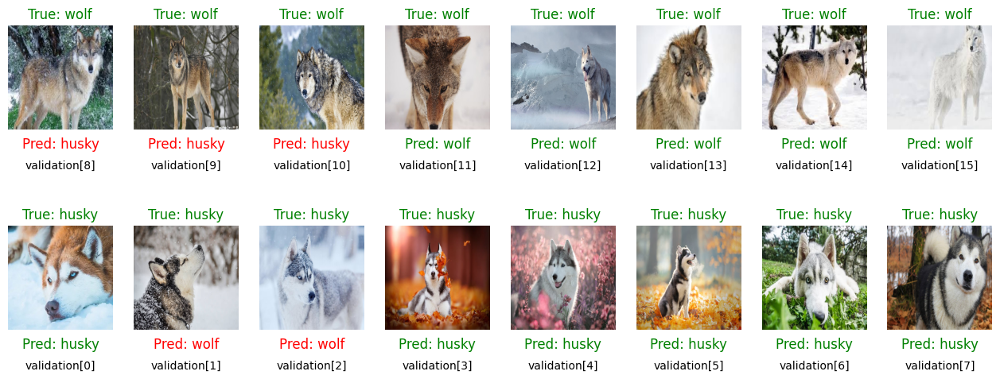

In [ ]:
j = 1
k = 10
plt.figure(figsize=(18,6))
for i in range(16):
  if labels[i] == 0:
    ax = plt.subplot(2,9,k)
    k += 1
  else:
    ax = plt.subplot(2,9,j)
    j+=1

  plt.imshow((images[i]*255).astype('uint8'))

  # Display true and predicted labels
  true_label = class_names[labels[i]]
  predicted_label = class_names[np.argmax(predictions[i])]

  plt.title(f"True: {true_label}", color='green')
  plt.text(128,300, f"Pred: {predicted_label}", color='red' if true_label != predicted_label else 'green', fontsize='large', horizontalalignment='center')
  plt.text(128,350, 'validation[{0}]'.format(i), horizontalalignment='center')

  plt.axis('off')


## Visualizing saliency maps

1/1 [==============================] - 0s 34ms/step


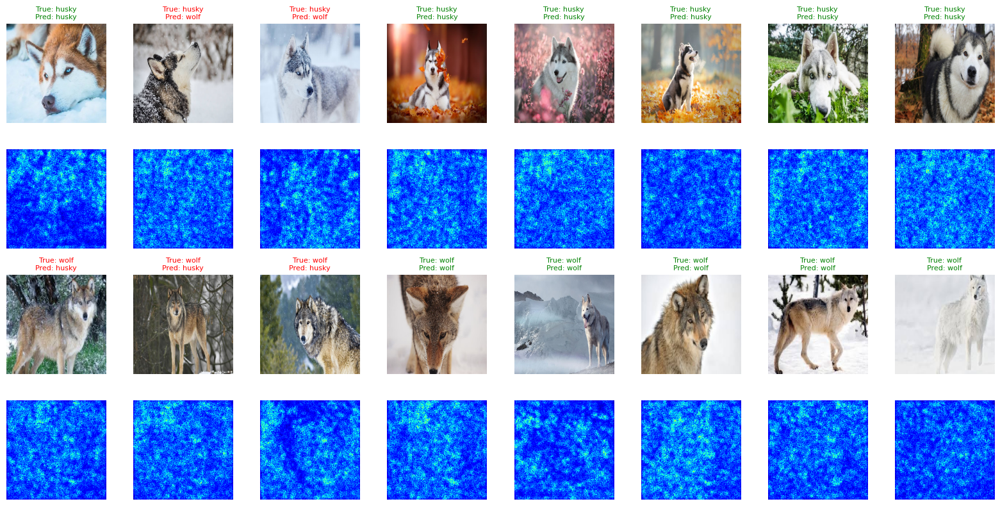

In [ ]:
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
replace2linear = ReplaceToLinear()

score = CategoricalScore([0]*8+[1]*8)

saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

saliency_map = saliency(score,
                        images)

# Render
# Adjusting layout to show original image above saliency map
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Saliency Map in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')

# Plot Wolves (Original in row 3, Saliency Map in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')


plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 33ms/step


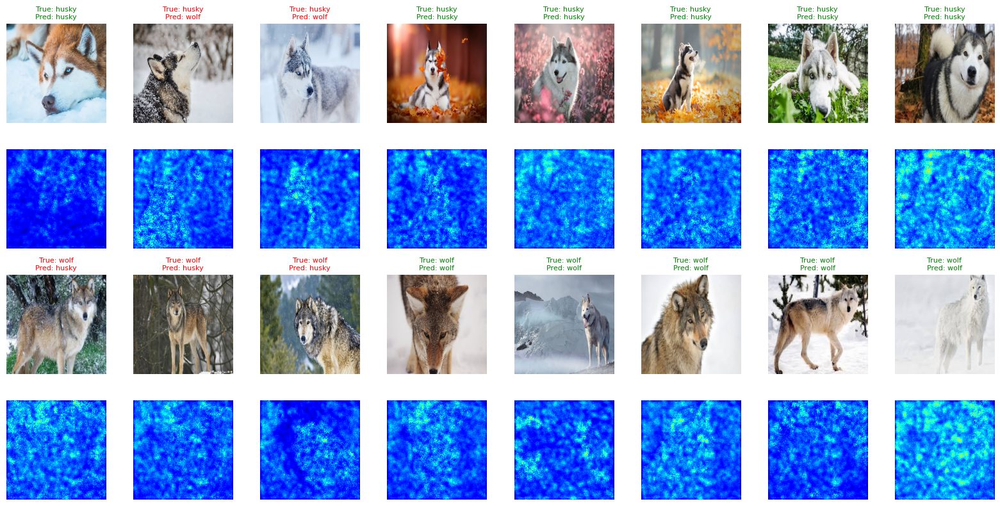

In [88]:
# Generate saliency map with smoothing that reduce noise by adding noise
saliency = Saliency(model,
                    model_modifier=replace2linear,
                    clone=True)

# Generate saliency map with smoothing using a smooth_noise value appropriate for normalized images
saliency_map = saliency(score,
                        images, # Use the normalized images here
                        smooth_samples=20, # The number of calculating gradients iterations.
                        smooth_noise=0.05) # Use a small float for noise standard deviation on [0, 1] scale

# Render
# Adjusting layout to show original image above saliency map
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Saliency Map in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')

# Plot Wolves (Original in row 3, Saliency Map in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Saliency Map
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    ax2.imshow(saliency_map[img_index], cmap='jet') # Display saliency map
    ax2.axis('off')


plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 31ms/step


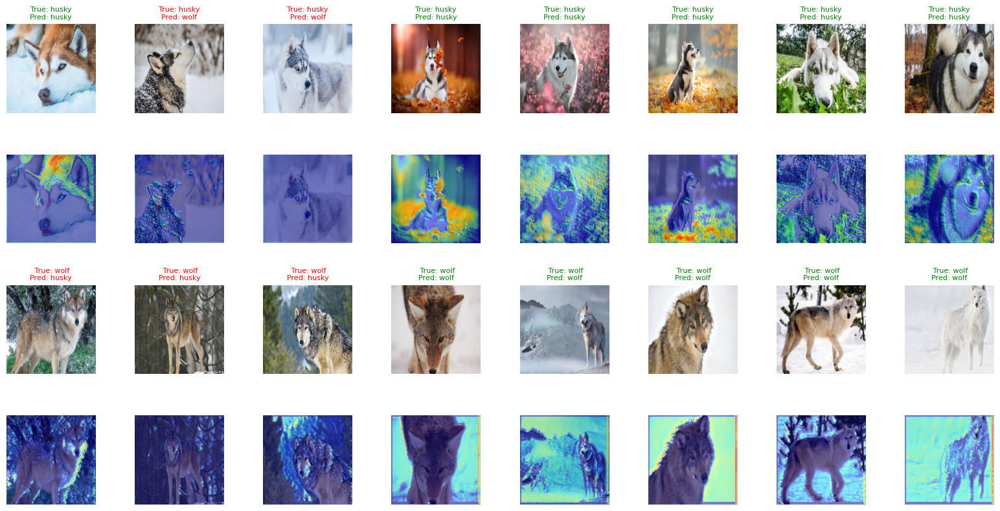

In [89]:
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam

# Create Gradcam object
gradcam = Gradcam(model,
                  model_modifier=replace2linear,
                  clone=True)

# Generate heatmap with GradCAM
# Use the 'score' defined for the husky and wolf images.
cam = gradcam(score,
              images, # Use the normalized husky and wolf images
              penultimate_layer=-1)

# Render the GradCAM heatmaps for the husky and wolf validation images
# Adjusting layout to show original image above heatmap
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Heatmap in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

# Plot Wolves (Original in row 3, Heatmap in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"\n\n True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 31ms/step


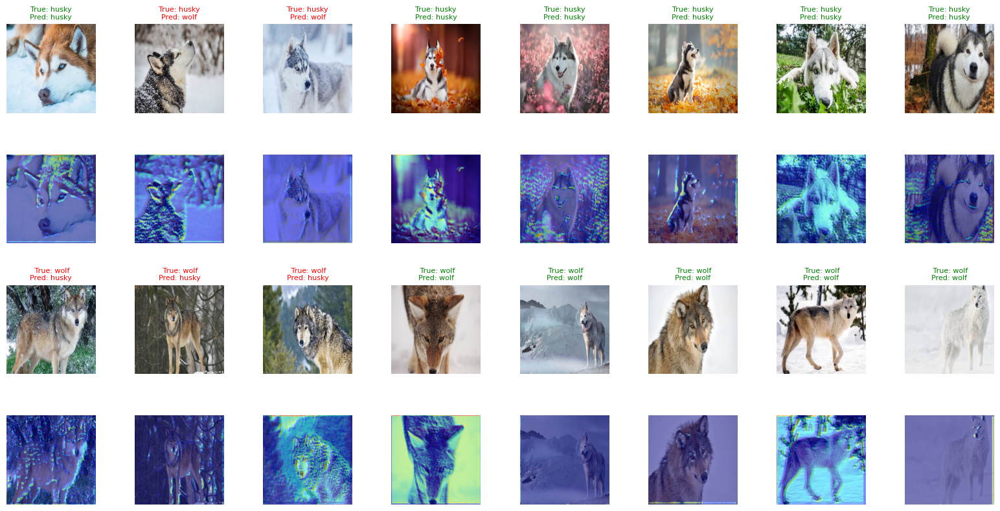

In [90]:
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus

# Create GradCAM++ object
gradcam = GradcamPlusPlus(model,
                          model_modifier=replace2linear,
                          clone=True)

# Generate heatmap with GradCAM++
cam = gradcam(score,
              images,
              penultimate_layer=-1)

# Render the GradCAM heatmaps for the husky and wolf validation images
# Adjusting layout to show original image above heatmap
plt.figure(figsize=(16, 8)) # Adjusted figure size for 4 rows x 8 columns

# Get predictions to display predicted labels
predictions = model.predict(images)

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

# Plot Huskies (Original in row 1, Heatmap in row 2)
for i, img_index in enumerate(husky_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 1)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 9) # Row 2, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

# Plot Wolves (Original in row 3, Heatmap in row 4)
for i, img_index in enumerate(wolf_indices):
    # Original Image
    ax1 = plt.subplot(4, 8, i + 17) # Row 3, column i+1 (8 columns in a row)
    ax1.imshow((images[img_index]*255).astype('uint8'))
    ax1.set_title(f"\n\n True: {class_names[labels[img_index]]}\nPred: {class_names[np.argmax(predictions[img_index])]}", fontsize=8, color='green' if np.argmax(predictions[img_index]) == labels[img_index] else 'red')
    ax1.axis('off')

    # Heatmap
    ax2 = plt.subplot(4, 8, i + 25) # Row 4, column i+1 (8 columns in a row)
    heatmap = np.uint8(cm.jet(cam[img_index])[..., :3] * 255)
    ax2.imshow((images[img_index]*255).astype('uint8')) # Display original image under heatmap
    ax2.imshow(heatmap, cmap='jet', alpha=0.5) # overlay
    ax2.axis('off')

plt.tight_layout()
plt.show()

## Neural Network Layer Dissections/visualizations for the Assignment Model

Applied Activation Maximization to a layer in the trained husky/wolf model to visualize what patterns specific filters have learned to detect.

### Visualizing Multiple Filters with Activation Maximization

Visualization of the patterns that maximally activate the filters.

Generating activations for layer: CONV_LAYER_1
  Generating activation for filter: 0
  Generating activation for filter: 1
  Generating activation for filter: 2
  Generating activation for filter: 3
  Generating activation for filter: 4
  Generating activation for filter: 5
  Generating activation for filter: 6
  Generating activation for filter: 7
Generating activations for layer: CONV_LAYER_2
  Generating activation for filter: 0
  Generating activation for filter: 1
  Generating activation for filter: 2
  Generating activation for filter: 3


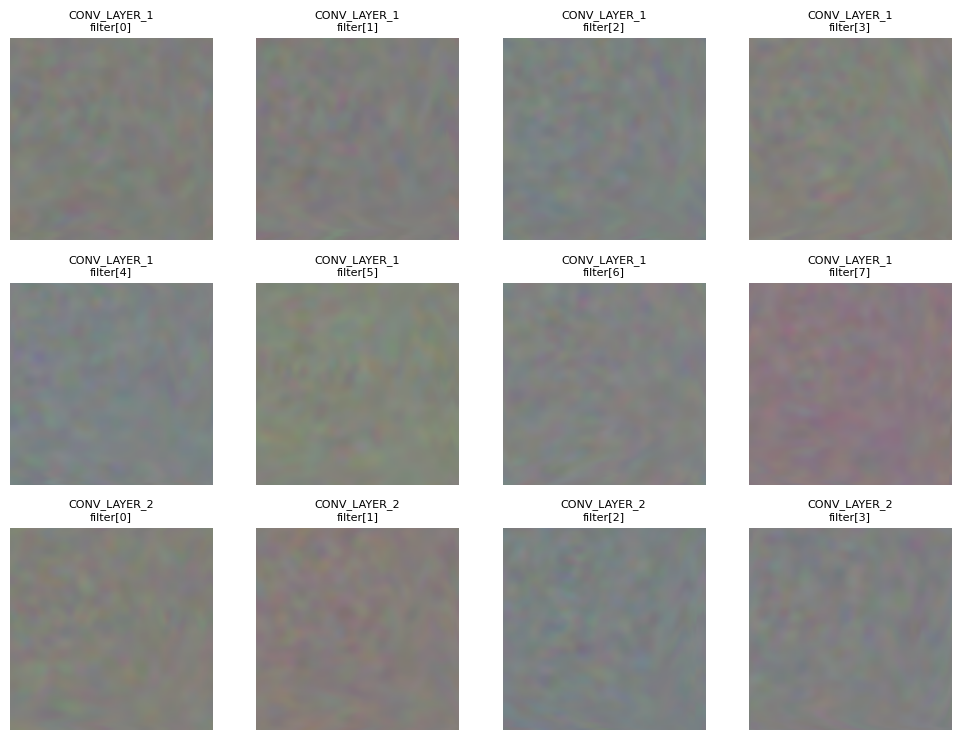


Activation maximization visualization complete for selected filters.


In [95]:
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer, ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.activation_maximization import ActivationMaximization


# Define the layers and number of filters to visualize
layers_to_visualize = {
    'CONV_LAYER_1': 8,  # conv2d_2 has 8 filters
    'CONV_LAYER_2': 4   # conv2d_3 has 4 filters
}

# Determine the total number of subplots needed
total_filters = sum(layers_to_visualize.values())
n_cols = 4 # Number of columns in the plot grid
n_rows = (total_filters + n_cols - 1) // n_cols # Calculate number of rows needed

plt.figure(figsize=(n_cols * 2.5, n_rows * 2.5)) # Adjust figure size

plot_index = 1

# Iterate through layers and filters
for layer_name, num_filters in layers_to_visualize.items():
    print(f"Generating activations for layer: {layer_name}")

    # This instance constructs a new model whose output is replaced to the target layer's output.
    extract_intermediate_layer = ExtractIntermediateLayer(index_or_name=layer_name)

    # This instance modifies the model's last activation function to linear one.
    replace2linear = ReplaceToLinear()

    # Create an ActivationMaximization instance for the current layer
    activation_maximization = ActivationMaximization(model,
                                                   model_modifier=[extract_intermediate_layer, replace2linear],
                                                   clone=True)

    # Iterate through filters in the current layer
    for filter_number in range(num_filters):
        print(f"  Generating activation for filter: {filter_number}")
        # The score function for Activation Maximization on an intermediate layer filter is the filter index.
        score = CategoricalScore(filter_number)

        # Generate maximized activation for the current filter
        # Using fewer steps for potentially faster visualization across many filters
        activations = activation_maximization(score,
                                              callbacks=[]) # Removed progress bar for cleaner output during loop


        # Render the maximized activation image
        ax = plt.subplot(n_rows, n_cols, plot_index)

        # The output 'activations' is a list of images, take the first (and only) element.
        activation_image = activations[0]

        # Ensure the shape is suitable for displaying (H, W, C) or (H, W)
        # Clamp values to 0-255 range before casting to uint8
        activation_image = np.clip(activation_image, 0, 255)
        activation_image = tf.cast(activation_image, np.uint8)


        ax.imshow(activation_image)
        ax.set_title(f'{layer_name}\nfilter[{filter_number}]', fontsize=8)
        ax.axis('off')

        plot_index += 1

plt.tight_layout()
plt.show()

print("\nActivation maximization visualization complete for selected filters.")

1/1 [==============================] - 0s 34ms/step
Generating LIME explanation for image index 0...


100%|██████████| 5000/5000 [00:26<00:00, 192.17it/s]


Generating LIME explanation for image index 1...


100%|██████████| 5000/5000 [00:25<00:00, 194.59it/s]


Generating LIME explanation for image index 2...


100%|██████████| 5000/5000 [00:25<00:00, 192.88it/s]


Generating LIME explanation for image index 3...


100%|██████████| 5000/5000 [00:25<00:00, 195.38it/s]


Generating LIME explanation for image index 4...


100%|██████████| 5000/5000 [00:26<00:00, 187.74it/s]


Generating LIME explanation for image index 5...


100%|██████████| 5000/5000 [00:26<00:00, 191.24it/s]


Generating LIME explanation for image index 6...


100%|██████████| 5000/5000 [00:26<00:00, 189.35it/s]


Generating LIME explanation for image index 7...


100%|██████████| 5000/5000 [00:26<00:00, 190.08it/s]


Generating LIME explanation for image index 8...


100%|██████████| 5000/5000 [00:25<00:00, 194.01it/s]


Generating LIME explanation for image index 9...


100%|██████████| 5000/5000 [00:26<00:00, 191.53it/s]


Generating LIME explanation for image index 10...


100%|██████████| 5000/5000 [00:26<00:00, 190.61it/s]


Generating LIME explanation for image index 11...


100%|██████████| 5000/5000 [00:25<00:00, 192.98it/s]


Generating LIME explanation for image index 12...


100%|██████████| 5000/5000 [00:25<00:00, 195.48it/s]


Generating LIME explanation for image index 13...


100%|██████████| 5000/5000 [00:25<00:00, 192.66it/s]


Generating LIME explanation for image index 14...


100%|██████████| 5000/5000 [00:25<00:00, 195.03it/s]


Generating LIME explanation for image index 15...


100%|██████████| 5000/5000 [00:25<00:00, 193.17it/s]


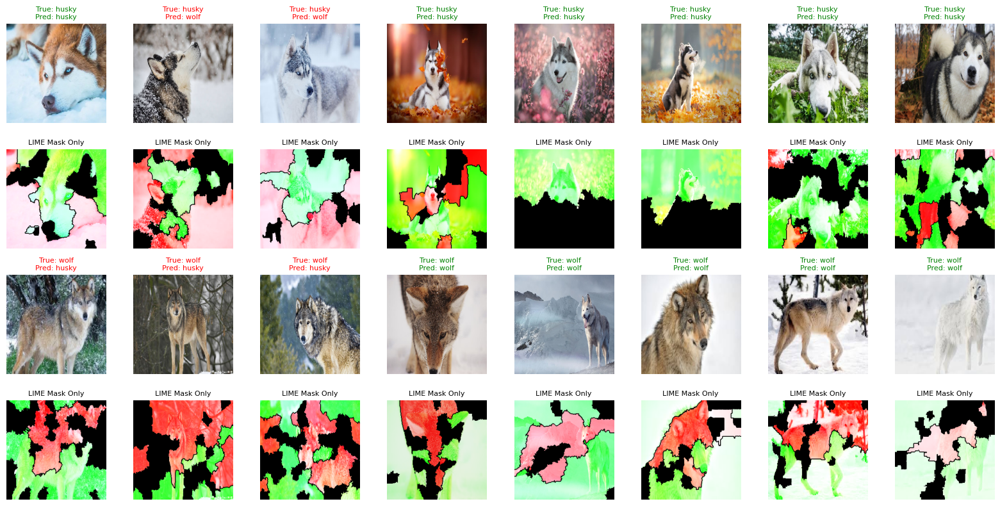


LIME explanation visualization complete for all validation images.


In [103]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
import numpy as np

# Creating the explainer object
explainer = lime_image.LimeImageExplainer()

# Get predictions for all images to determine correct/incorrect classifications
predictions = model.predict(images)

# Render LIME explanations for all husky and wolf validation images
# Adjusted figure size for 4 rows x 8 columns (Original and Mask Only for each class)
plt.figure(figsize=(16, 8)) # Adjusted figure height

husky_indices = [i for i, label in enumerate(labels) if label == 0]
wolf_indices = [i for i, label in enumerate(labels) if label == 1]

def silent_predict(x):
    return model.predict(x, verbose=0)

# Function to generate and plot LIME explanation for a single image
def plot_lime_explanation(image_index, subplot_row_original, subplot_row_mask_only):
    print(f"Generating LIME explanation for image index {image_index}...")
    # LIME expects images in the [0, 255] range and uint8 dtype
    image_for_lime = (images[image_index] * 255).astype(np.uint8)

    # Generate LIME explanation
    num_samples = 5000

    explanation = explainer.explain_instance(image_for_lime,
                                             silent_predict,
                                             top_labels=2, # Explain the top 2 predicted classes to ensure the true label is considered
                                             hide_color=0,
                                             num_samples=num_samples)

    # Use the TRUE class index from the labels instead of the predicted one
    true_class_index = labels[image_index]

    # Get image and mask for visualization (Mask Only)
    # Modified get_image_and_mask parameters to show more features and both positive/negative
    temp_mask_only, mask_mask_only = explanation.get_image_and_mask(
        true_class_index,
        positive_only=False,  # Show both positive and negative features
        num_features=30,      # Increase number of features shown
        hide_rest=True)       # Hide the rest

    # Add after getting the mask
    if np.sum(mask_mask_only) == 0:
        print(f"Warning: Empty mask for image {image_index} (true class: {class_names[true_class_index]})")
        # Get the top predicted class and see its explanation instead
        pred_class = np.argmax(predictions[image_index])
        print(f"Showing explanation for predicted class ({class_names[pred_class]}) instead")
        temp_mask_only, mask_mask_only = explanation.get_image_and_mask(
            pred_class,
            positive_only=False,
            num_features=30,
            hide_rest=True)


    # Plot Original Image with Title
    ax1 = plt.subplot(4, 8, subplot_row_original) # 4 rows total
    ax1.imshow((images[image_index]*255).astype('uint8')) # Display original normalized image
    true_label = class_names[labels[image_index]]
    predicted_label = class_names[np.argmax(predictions[image_index])]
    ax1.set_title(f"True: {true_label}\nPred: {predicted_label}", fontsize=8, color='green' if np.argmax(predictions[image_index]) == labels[image_index] else 'red')
    ax1.axis('off')

    # Plot LIME Mask Only
    ax3 = plt.subplot(4, 8, subplot_row_mask_only) # 4 rows total
    # mark_boundaries returns float, cast to uint8 to avoid warning.
    ax3.imshow(mark_boundaries(temp_mask_only, mask_mask_only).astype(np.uint8))
    ax3.set_title(f"LIME Mask Only", fontsize=8)
    ax3.axis('off')


# Plot Huskies (Original in row 1, Mask Only in row 2)
for i, img_index in enumerate(husky_indices):
    plot_lime_explanation(img_index, i + 1, i + 9) # Row indices 1, 2

# Plot Wolves (Original in row 3, Mask Only in row 4)
for i, img_index in enumerate(wolf_indices):
    plot_lime_explanation(img_index, i + 17, i + 25) # Row indices 3, 4 (start indices: 2*8+1, 3*8+1)

plt.tight_layout()
plt.show()

print("\nLIME explanation visualization complete for all validation images.")

## Analysis and conclusion

### Model  and analysis details

Training dataset size: 76 images

Validation dataset size: 16 images

Accuracy on validation set: 68.8% (11 of 16 images correct)

XAI methods used (for all validation images and filters):
 * Saliency maps (with and without smoothing):
 * GradCam, GradCam++
 * Network dissection/filter analysis
 * LIME: Areas that positively contributed to predicting the true class will be green. Areas with negative contribution will be red.

### Analysis of what the model seem to have learned

As the model has poor performance (68% accuracy) we can expect that there are significant shortcomings in what that model has learned. There are signs that the model perhaps has learned to identify some valuable features, but also some signs that are more troubling.

The plotting of the convolutional filters didn't give me any clear insights to what has been learned. Better training, data and architecture could improve this.


**Face/head features:** It seems that the model have paid some attention to the ear shape, especially in the images that were correctly classified as wolves.

**Background and vegetation features:** It more strongly seems like the model interprets images with backgrounds that are colorful and/or have patterns (grass, leaves, branches) to be a husky (see huskies 4,5,6,7,8 in LIME mask and standard GradCAM analysis). Images without textured background seem more likely to be classified as wolves (see wolves 4,5,6,7,8 in the LIME mask and standard GradCAM analysis).

### Conclusions
The model seems to be paying more attention to background/environment than features of the animals when making predictions. Limitations in the dataset, the training process and model architecture are likely causes for this. This seems like an example of "shortcut learning/Clever Hans effect" and the model will not be good at predicting class for images in which the background is not similar to the backgrounds in the training data sets of the same class.

The current model now makes its prediction based on where the specific animal were typically photographed. Had there been more difference in appearance between huskies and wolves then the likelihood of the model focusing more on the animals instead of the background would be higher I believe.